# **Object Detection with COCO Dataset**

In this notebook, the [EfficientNetV2-S](https://arxiv.org/abs/2104.00298) model is fine-tuned using a subset of the [COCO (Common Objects in Context)](https://cocodataset.org/#home) dataset for the single-instance object detection task. The COCO dataset is a large-scale dataset designed for object detection, segmentation, and captioning tasks, used in research across a wide range of object categories. It has become a benchmark for evaluating computer vision models. The subset, called **COCO-SingleBBox**, consists of 10,135 images extracted from the COCO training dataset, where each image contains only one bounding box corresponding to one of 18 classes. It includes 8,108 images for training (80%) and 2,027 for validation (20%).

The EfficientNetV2-S model for **PyTorch** is available through the [timm](https://timm.fast.ai/) library. In this notebook, the specific version `efficientnetv2-s-21k-ft1k` will be used, which has been pre-trained on the [ImageNet21K](https://github.com/Alibaba-MIIL/ImageNet21K) dataset and fine-tuned on [ImageNet1K](https://www.image-net.org/download.php). Compared to earlier versions like [EfficientNet](https://arxiv.org/abs/1905.11946), EfficientNetV2 offers faster training, fewer parameters, and superior performance.

## **Imports**

In [1]:
# Installation of the TorchEval library
!pip install torcheval -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 4.7 MB/s eta 0:00:00


In [5]:
import torch
from torch.utils.data import Dataset, DataLoader
from torcheval.metrics import MulticlassAccuracy
from torch.optim.lr_scheduler import LambdaLR
from torchsummary import summary
import torch.nn as nn
import timm
import cv2
import albumentations as A
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import plotly.graph_objects as go
from google.colab import drive
from tqdm import tqdm
import requests
import io
import copy
import os

## **Parameters**

In [3]:
drive.mount("/content/drive/")

Mounted at /content/drive/


In [4]:
epochs = 50
batch_size = 16
patience = 7
model_name = "tf_efficientnetv2_s.in21k_ft_in1k"
dataset_path = "/content/COCO-SingleBBox"
zip_data_path = "/content/drive/MyDrive/Datasets/COCO-SingleBBox.zip"
image_size = (3, 384, 384)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## **Prepare the Dataset for Training**

### **Load the Dataset**

All dataset downloading and preliminary preprocessing for COCO-SingleBBox were completed in the following notebook: [Preprocessing_COCO-SingleBBox](https://github.com/JersonGB22/ObjectDetection-TensorFlow-PyTorch/blob/main/Preprocessing/Preprocessing_COCO-SingleBBox.ipynb).

In [6]:
# Unzip the dataset
!unzip -q $zip_data_path

In [7]:
# Load the training and validation DataFrames
df_train = pd.read_csv(os.path.join(dataset_path, "train_labels.csv"))
df_val = pd.read_csv(os.path.join(dataset_path, "val_labels.csv"))

df_train["label"] = df_train.label.apply(lambda x: eval(x))
df_val["label"] = df_val.label.apply(lambda x: eval(x))

df_train.head()

,name,label,image_path
0,cat,"[5, 0.0, 0.0, 0.8704773269689738, 0.961296875]",/content/COCO-SingleBBox/images/000000509609.jpg
1,pizza,"[12, 0.0033750000000000004, 0.0067500000000000...",/content/COCO-SingleBBox/images/000000072273.jpg
2,zebra,"[17, 0.08395312499999999, 0.4959905660377359, ...",/content/COCO-SingleBBox/images/000000432724.jpg
3,toilet,"[14, 0.2456875, 0.710109375, 0.7520625, 0.9887...",/content/COCO-SingleBBox/images/000000473099.jpg
4,bird,"[4, 0.091546875, 0.14581249999999998, 0.536406...",/content/COCO-SingleBBox/images/000000005694.jpg


In [10]:
# Extract the class names
class_names = df_train.name.sort_values().unique().tolist()
num_classes = len(class_names)

print(num_classes)
print(class_names)

18
['airplane', 'bear', 'bed', 'bench', 'bird', 'cat', 'clock', 'dog', 'elephant', 'fire hydrant', 'giraffe', 'horse', 'pizza', 'stop sign', 'toilet', 'train', 'vase', 'zebra']


### **Create the Training and Validation Datasets**

A custom class is created to build the datasets, load, and preprocess the images, classes, and bounding boxes, making them ready for training. To address overfitting and improve model performance, the [Albumentations](https://albumentations.ai/docs/) library will be used. This is a fast and flexible image augmentation library that is widely used in deep learning.

In [9]:
class CustomDataset(Dataset):
  def __init__(self, image_paths, labels, transform=None):
    self.image_paths = image_paths
    self.labels = labels
    self.transform = transform

  def __len__(self):
    return len(self.image_paths)

  def __getitem__(self, idx):
    image = cv2.imread(self.image_paths[idx])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, image_size[1:])

    label = self.labels[idx]
    cls, box = label[0], label[1:]

    if self.transform:
      transformed = self.transform(image=image, bboxes=[box], classes=[cls])

      # Do not consider the transformation if it does not return the bbox (min_visibility < 0.3)
      if len(transformed["classes"]) > 0:
        image = transformed["image"]
        cls = transformed["classes"][0]
        box = transformed["bboxes"][0]

    image = torch.tensor(image, dtype=torch.float32) / 255
    image = image.permute(2, 0, 1)

    cls = torch.tensor(cls, dtype=torch.long)
    box = torch.tensor(box, dtype=torch.float32)

    return image, (cls, box)


transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.15,
        scale_limit=0.1,
        rotate_limit=0,
        border_mode=cv2.BORDER_CONSTANT,
        value=0,
        p=0.5
    ),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.3, p=0.5),
], bbox_params=A.BboxParams(format="albumentations", label_fields=["classes"], min_visibility=0.3), p=1.0)

In [15]:
train_dataset = CustomDataset(
    df_train.image_path.values,
    df_train.label.values.tolist(),
    transform=transform
)
val_dataset = CustomDataset(
    df_val.image_path.values,
    df_val.label.values.tolist()
)

num_workers = os.cpu_count() // 2
print(len(train_dataset), len(val_dataset), num_workers)

train_dataset = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers
)
val_dataset = DataLoader(
    val_dataset,
    batch_size=batch_size,
    num_workers=num_workers
)

8108 2027 1


In [23]:
# Take a batch from the training dataset
images, (classes, boxes) = next(iter(train_dataset))

print(images.shape)
print(classes.shape)
print(boxes.shape)

torch.Size([16, 3, 384, 384])
torch.Size([16])
torch.Size([16, 4])


In [13]:
#Function to display images along with their corresponding bounding boxes
def show_images(images, classes, boxes, classes_pred=None, boxes_pred=None,
                n_rows=3, n_cols=3, random=True, save=False, path_save=""):

  indices = np.arange(len(images))
  if random:
    np.random.shuffle(indices)

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.25*n_cols, 3.25*n_rows))

  for i, ax in enumerate(axes.flat):
    image = images[indices[i]]
    cls = classes[indices[i]]
    box = boxes[indices[i]]
    shape = image.shape[1:]

    image = image.permute(1, 2, 0)
    ax.imshow(image)

    xmin, ymin, xmax, ymax = tuple(box)
    xmin, xmax = xmin * shape[1], xmax * shape[1]
    ymin, ymax = ymin * shape[0], ymax * shape[0]

    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.25, edgecolor="blue", facecolor="none")
    ax.add_patch(rect)

    condition = (classes_pred is not None) and (boxes_pred is not None)
    y_coor = -0.05*shape[0] if condition  else -0.005*shape[0]
    ax.text(
        x=shape[1]/2, y=y_coor, s=f"Label: {class_names[cls]}", color="mediumblue", fontsize=7,
        fontweight="bold", ha="center", va="bottom"
    )

    if condition:
      cls_pred = classes_pred[indices[i]]
      box_pred = boxes_pred[indices[i]]

      xmin_pred, ymin_pred, xmax_pred, ymax_pred = tuple(box_pred)
      xmin_pred, xmax_pred = xmin_pred * shape[1], xmax_pred * shape[1]
      ymin_pred, ymax_pred = ymin_pred * shape[0], ymax_pred * shape[0]

      rect = patches.Rectangle(
          (xmin_pred, ymin_pred), xmax_pred-xmin_pred, ymax_pred-ymin_pred,
          linewidth=1.25, edgecolor="red", facecolor="none"
      )
      ax.add_patch(rect)

      ax.text(
          x=shape[1]/2, y=-0.005*shape[0], s=f"Pred: {class_names[cls_pred]}", color="red", fontsize=7,
          fontweight="bold", ha="center", va="bottom"
      )
      ax.text(
          x=shape[1]/2, y=1.01*shape[0], s=f"IoU: {calculate_giou(box, box_pred).numpy():.2f}",
          fontsize=6.5, ha="center", va="top"
      )

    ax.axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

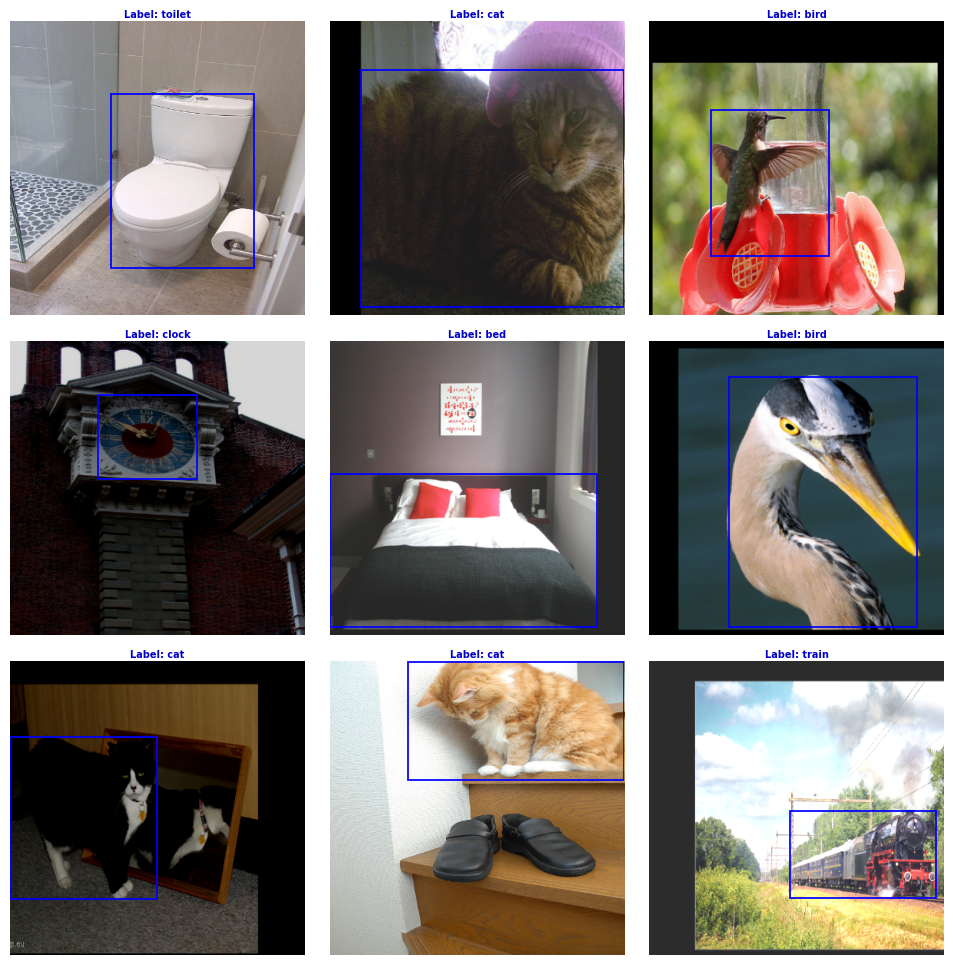

In [24]:
# Some images from the training dataset after data augmentation
show_images(images, classes, boxes, random=False)

## **Build the Model**

In [ ]:
# Class to build the model
class CustomModel(nn.Module):
  def __init__(self, model_name, num_classes, dropout_rate=0.2):
    super().__init__()

    self.base_model = timm.create_model(model_name, pretrained=True, num_classes=0)
    self.dropout = nn.Dropout(dropout_rate)
    self.classifier = nn.Linear(self.base_model.num_features, num_classes)
    self.box_regressor = nn.Linear(self.base_model.num_features, 4)

  def forward(self, x):
    x = self.base_model(x)
    dropout_out = self.dropout(x)

    cls_out = self.classifier(dropout_out)
    bbox_out = self.box_regressor(x)

    return cls_out, bbox_out

In [ ]:
model = CustomModel(model_name, num_classes).to(device)
summary(model, input_size=image_size)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
        Conv2dSame-1         [-1, 24, 192, 192]             648
          Identity-2         [-1, 24, 192, 192]               0
              SiLU-3         [-1, 24, 192, 192]               0
    BatchNormAct2d-4         [-1, 24, 192, 192]              48
            Conv2d-5         [-1, 24, 192, 192]           5,184
          Identity-6         [-1, 24, 192, 192]               0
              SiLU-7         [-1, 24, 192, 192]               0
    BatchNormAct2d-8         [-1, 24, 192, 192]              48
          Identity-9         [-1, 24, 192, 192]               0
         Identity-10         [-1, 24, 192, 192]               0
        ConvBnAct-11         [-1, 24, 192, 192]               0
           Conv2d-12         [-1, 24, 192, 192]           5,184
         Identity-13         [-1, 24, 192, 192]               0
             SiLU-14         [-1, 24, 1

In [ ]:
model.base_model.pretrained_cfg

{'url': 'https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-effv2-weights/tf_efficientnetv2_s_21ft1k-d7dafa41.pth',
 'hf_hub_id': 'timm/tf_efficientnetv2_s.in21k_ft_in1k',
 'architecture': 'tf_efficientnetv2_s',
 'tag': 'in21k_ft_in1k',
 'custom_load': False,
 'input_size': (3, 300, 300),
 'test_input_size': (3, 384, 384),
 'fixed_input_size': False,
 'interpolation': 'bicubic',
 'crop_pct': 1.0,
 'crop_mode': 'center',
 'mean': (0.5, 0.5, 0.5),
 'std': (0.5, 0.5, 0.5),
 'num_classes': 1000,
 'pool_size': (10, 10),
 'first_conv': 'conv_stem',
 'classifier': 'classifier'}

Although the model configuration specifies that image normalization should be in the range of [-1, 1], which is equivalent to setting `mean` and `std` to 0.5 for all three channels, the model performs slightly better when normalized in the range [0, 1]. Therefore, the training and validation datasets were normalized in this range.

## **Train the Model**

In object detection, better results can be achieved by combining the standard loss for **bounding boxes** (Mean Squared Error or **MSE**) with the **GIoU** loss (Generalized Intersection over Union). GIoU is an improvement over the **IoU** (Intersection over Union) metric, which measures the overlap between the predicted and ground truth bounding boxes. While IoU only considers the common area between the two boxes, GIoU introduces an additional term that penalizes the lack of overlap, even when the boxes do not intersect. This helps improve model convergence, especially in scenarios where the predicted boxes are misaligned or fall outside the area of interest. For more details, see the following [article](https://giou.stanford.edu/GIoU.pdf).

The model's performance in predicting bounding boxes is better assessed using the IoU metric, which is calculated as the ratio of the intersection area to the union area of two boxes. Conventional accuracy is not suitable for this task. The IoU value ranges from 0 to 1, with 1 indicating a perfect match.

In [ ]:
# Function to calculate IoU and GIoU given the coordinates of two Bounding Boxes
def calculate_giou(box_pred, box_true, metric="iou"):

  # Convert the box coordinates to float32
  box_true = box_true.float()
  box_pred = box_pred.float()

  # Extract the minimum and maximum coordinates of the boxes
  xmin_true, ymin_true, xmax_true, ymax_true = box_true.unbind(dim=-1)
  xmin_pred, ymin_pred, xmax_pred, ymax_pred = box_pred.unbind(dim=-1)

  # Calculate the areas of the true and predicted boxes
  width_true = torch.clamp(xmax_true - xmin_true, min=0)
  height_true = torch.clamp(ymax_true - ymin_true, min=0)
  width_pred = torch.clamp(xmax_pred - xmin_pred, min=0)
  height_pred = torch.clamp(ymax_pred - ymin_pred, min=0)
  area_true = width_true * height_true
  area_pred = width_pred * height_pred

  # Calculate the intersection area
  intersect_xmin = torch.maximum(xmin_true, xmin_pred)
  intersect_ymin = torch.maximum(ymin_true, ymin_pred)
  intersect_xmax = torch.minimum(xmax_true, xmax_pred)
  intersect_ymax = torch.minimum(ymax_true, ymax_pred)
  intersect_width = torch.clamp(intersect_xmax - intersect_xmin, min=0)
  intersect_height = torch.clamp(intersect_ymax - intersect_ymin, min=0)
  intersect_area = intersect_width * intersect_height

  # Calculate the union area
  union_area = area_true + area_pred - intersect_area

  # Calculate IoU
  iou = intersect_area / union_area.clamp(min=1e-6)

  # Return IoU if required
  if metric == "iou":
    return iou

  # Calculate the area of the minimum enclosing box
  enclose_xmin = torch.minimum(xmin_true, xmin_pred)
  enclose_ymin = torch.minimum(ymin_true, ymin_pred)
  enclose_xmax = torch.maximum(xmax_true, xmax_pred)
  enclose_ymax = torch.maximum(ymax_true, ymax_pred)
  enclose_width = torch.clamp(enclose_xmax - enclose_xmin, min=0)
  enclose_height = torch.clamp(enclose_ymax - enclose_ymin, min=0)
  enclose_area = enclose_width * enclose_height

  # Calculate GIoU
  giou = iou - ((enclose_area - union_area) / enclose_area.clamp(min=1e-6))
  return giou

In [ ]:
# Custom loss that combines MSE and GIoU for the bounding boxes
def mse_giou_loss(box_pred, box_true):
  mse = nn.MSELoss()
  loss_mse = mse(box_pred, box_true)

  loss_giou = 1 - calculate_giou(box_pred, box_true, metric="giou")
  loss_giou = loss_giou.mean()

  loss = 5*loss_mse + 2*loss_giou
  return loss

The total loss of the model is given by the following formula:

**$$ \text{TotalLoss} = 0.5 \times \text{SparseCategoricalCrossentropy} + 7.5 \times (2 \times \text{GIoULoss} + 5 \times \text{MeanSquaredError}) $$**

The loss of the `box_regressor` has a significantly larger weight compared to the `classifier`, as the `classifier` loss converges much more quickly.


In [ ]:
# Function to execute a training or validation epoch
def train_one_epoch(model, dataset, optimizer, lr_scheduler, cls_metric, training=True):
  # Set the model to training or validation mode
  if training:
    model.train()
  else:
    model.eval()

  # Reset the classification metric
  cls_metric.reset()

  # Initialize the metrics and losses for the epoch
  cls_loss_epoch, box_loss_epoch, iou_epoch, step = (0, 0, 0, 0)

  with tqdm(dataset, desc="Train" if training else "  Val") as pbar:
    for images, (classes, boxes) in pbar:
      cur_batch_size = len(images)

      # Move the images and labels to the device (GPU)
      images = images.to(device)
      classes = classes.to(device)
      boxes = boxes.to(device)

      # Reset optimizer gradients
      optimizer.zero_grad()

      # Enable gradient computation if the model is in training mode
      with torch.set_grad_enabled(training):
        classes_pred, boxes_pred = model(images) #Forward
        boxes_pred = boxes_pred.sigmoid()

        # Compute losses
        cls_loss = nn.CrossEntropyLoss()(classes_pred, classes)
        box_loss = mse_giou_loss(boxes_pred, boxes)
        loss = 0.5*cls_loss + 7.5*box_loss

        # Backward
        if training:
          loss.backward()
          optimizer.step()
          lr_scheduler.step()

      # Update the epoch losses
      cls_loss_epoch += cls_loss.item() * cur_batch_size
      box_loss_epoch += box_loss.item() * cur_batch_size

      # Update the epoch metrics
      cls_metric.update(classes_pred.detach(), classes.detach())
      iou = calculate_giou(boxes_pred.detach(), boxes.detach()).mean()
      iou_epoch += iou.item() * cur_batch_size

      # Update progress bar
      step += cur_batch_size
      phase = "" if training else "val_"
      dic_results = {
          f"{phase}cls_loss": cls_loss_epoch / step,
          f"{phase}box_loss": box_loss_epoch /step,
          f"{phase}accuracy": cls_metric.compute().item(),
          f"{phase}iou": iou_epoch / step,
      }

      if training:
        dic_results["lr"] = lr_scheduler.get_last_lr()[0]

      pbar.set_postfix(dic_results)

  return dic_results

During training, the validation IoU metric will be used for monitoring, as it converges more slowly.

In [ ]:
# Function for model training
def train_model(model, train_dataset, val_dataset, optimizer, lr_scheduler, epochs=10, patience=5):
  history = {
      "cls_loss": [], "box_loss": [], "accuracy": [], "iou": [],
      "val_cls_loss": [], "val_box_loss": [], "val_accuracy": [], "val_iou": []
  }

  # Copy the model's initial weights
  best_model_weights = copy.deepcopy(model.state_dict())

  cls_metric = MulticlassAccuracy()
  best_metric = float("-inf")
  wait = 0

  for epoch in range(epochs):
    print(f"Epoch: {epoch + 1}/{epochs}")

    train_results = train_one_epoch(model, train_dataset, optimizer, lr_scheduler, cls_metric)

    with torch.no_grad():
      val_results = train_one_epoch(model, val_dataset, optimizer, lr_scheduler, cls_metric, training=False)

    # Add the losses and metrics to the history dictionary
    for (train_k, train_v), (val_k, val_v) in zip(train_results.items(), val_results.items()):
      history[train_k].append(train_v)
      history[val_k].append(val_v)

    # Check if 'val_iou' increased to copy the model's weights
    metric = val_results["val_iou"]
    if metric > best_metric:
      best_model_weights = copy.deepcopy(model.state_dict())
      best_metric = metric
      wait = 0
    else:
      wait += 1

    if wait >= patience:
      break

    print()

  # Load the best weights into the model
  model.load_state_dict(best_model_weights)

  return history

To achieve the best results, a learning rate scheduler with a polynomial decay schedule will be used.

In [ ]:
lr0 = 1e-4
lrf = 1e-6
decay_steps = len(train_dataset) * epochs
power = 1.0

def polynomial_decay(step):
  step = min(step, decay_steps)
  decayed_lr = (lr0 - lrf) * ((1 - (step / decay_steps)) ** power) + lrf
  return decayed_lr / lr0

optimizer = torch.optim.Adam(model.parameters(), lr=lr0)
lr_scheduler = LambdaLR(optimizer, lr_lambda=polynomial_decay)

In [ ]:
history = train_model(model, train_dataset, val_dataset, optimizer, lr_scheduler, epochs, patience)

Epoch: 1/50


  Val: 100%|██████████| 127/127 [00:40<00:00,  3.17it/s, val_cls_loss=0.609, val_box_loss=0.941, val_accuracy=0.918, val_iou=0.584]



Epoch: 2/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.80it/s, val_cls_loss=0.401, val_box_loss=0.733, val_accuracy=0.938, val_iou=0.663]



Epoch: 3/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.46it/s, val_cls_loss=0.356, val_box_loss=0.602, val_accuracy=0.946, val_iou=0.722]



Epoch: 4/50


  Val: 100%|██████████| 127/127 [00:30<00:00,  4.21it/s, val_cls_loss=0.276, val_box_loss=0.628, val_accuracy=0.945, val_iou=0.706]



Epoch: 5/50


  Val: 100%|██████████| 127/127 [00:26<00:00,  4.88it/s, val_cls_loss=0.286, val_box_loss=0.516, val_accuracy=0.948, val_iou=0.761]



Epoch: 6/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.95it/s, val_cls_loss=0.223, val_box_loss=0.511, val_accuracy=0.955, val_iou=0.765]



Epoch: 7/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.55it/s, val_cls_loss=0.213, val_box_loss=0.49, val_accuracy=0.957, val_iou=0.773]



Epoch: 8/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.69it/s, val_cls_loss=0.187, val_box_loss=0.473, val_accuracy=0.962, val_iou=0.78]



Epoch: 9/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.67it/s, val_cls_loss=0.189, val_box_loss=0.471, val_accuracy=0.959, val_iou=0.783]



Epoch: 10/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.14it/s, val_cls_loss=0.165, val_box_loss=0.412, val_accuracy=0.969, val_iou=0.809]



Epoch: 11/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.64it/s, val_cls_loss=0.175, val_box_loss=0.426, val_accuracy=0.965, val_iou=0.802]



Epoch: 12/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.42it/s, val_cls_loss=0.175, val_box_loss=0.414, val_accuracy=0.962, val_iou=0.81]



Epoch: 13/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.22it/s, val_cls_loss=0.151, val_box_loss=0.416, val_accuracy=0.968, val_iou=0.806]



Epoch: 14/50


  Val: 100%|██████████| 127/127 [00:25<00:00,  4.90it/s, val_cls_loss=0.181, val_box_loss=0.419, val_accuracy=0.964, val_iou=0.808]



Epoch: 15/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.66it/s, val_cls_loss=0.159, val_box_loss=0.422, val_accuracy=0.968, val_iou=0.806]



Epoch: 16/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.11it/s, val_cls_loss=0.168, val_box_loss=0.407, val_accuracy=0.967, val_iou=0.811]



Epoch: 17/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.80it/s, val_cls_loss=0.148, val_box_loss=0.391, val_accuracy=0.967, val_iou=0.819]



Epoch: 18/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.36it/s, val_cls_loss=0.152, val_box_loss=0.387, val_accuracy=0.966, val_iou=0.821]



Epoch: 19/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.81it/s, val_cls_loss=0.141, val_box_loss=0.385, val_accuracy=0.969, val_iou=0.823]



Epoch: 20/50


  Val: 100%|██████████| 127/127 [00:26<00:00,  4.83it/s, val_cls_loss=0.137, val_box_loss=0.373, val_accuracy=0.969, val_iou=0.828]



Epoch: 21/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.25it/s, val_cls_loss=0.163, val_box_loss=0.399, val_accuracy=0.966, val_iou=0.818]



Epoch: 22/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.81it/s, val_cls_loss=0.132, val_box_loss=0.372, val_accuracy=0.972, val_iou=0.829]



Epoch: 23/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.48it/s, val_cls_loss=0.142, val_box_loss=0.391, val_accuracy=0.967, val_iou=0.822]



Epoch: 24/50


  Val: 100%|██████████| 127/127 [00:26<00:00,  4.84it/s, val_cls_loss=0.148, val_box_loss=0.38, val_accuracy=0.969, val_iou=0.828]



Epoch: 25/50


  Val: 100%|██████████| 127/127 [00:25<00:00,  4.92it/s, val_cls_loss=0.136, val_box_loss=0.382, val_accuracy=0.97, val_iou=0.825]



Epoch: 26/50


  Val: 100%|██████████| 127/127 [00:25<00:00,  4.91it/s, val_cls_loss=0.14, val_box_loss=0.362, val_accuracy=0.972, val_iou=0.835]



Epoch: 27/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.75it/s, val_cls_loss=0.14, val_box_loss=0.362, val_accuracy=0.971, val_iou=0.834]



Epoch: 28/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.65it/s, val_cls_loss=0.135, val_box_loss=0.361, val_accuracy=0.971, val_iou=0.835]



Epoch: 29/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.47it/s, val_cls_loss=0.128, val_box_loss=0.355, val_accuracy=0.971, val_iou=0.837]



Epoch: 30/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.43it/s, val_cls_loss=0.132, val_box_loss=0.363, val_accuracy=0.97, val_iou=0.834]



Epoch: 31/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.19it/s, val_cls_loss=0.143, val_box_loss=0.355, val_accuracy=0.966, val_iou=0.838]



Epoch: 32/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.88it/s, val_cls_loss=0.146, val_box_loss=0.354, val_accuracy=0.968, val_iou=0.838]



Epoch: 33/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.09it/s, val_cls_loss=0.143, val_box_loss=0.342, val_accuracy=0.971, val_iou=0.844]



Epoch: 34/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.50it/s, val_cls_loss=0.13, val_box_loss=0.339, val_accuracy=0.972, val_iou=0.845]



Epoch: 35/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.82it/s, val_cls_loss=0.127, val_box_loss=0.346, val_accuracy=0.968, val_iou=0.842]



Epoch: 36/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.63it/s, val_cls_loss=0.125, val_box_loss=0.34, val_accuracy=0.972, val_iou=0.844]



Epoch: 37/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.42it/s, val_cls_loss=0.138, val_box_loss=0.332, val_accuracy=0.969, val_iou=0.847]



Epoch: 38/50


  Val: 100%|██████████| 127/127 [00:25<00:00,  4.95it/s, val_cls_loss=0.127, val_box_loss=0.325, val_accuracy=0.967, val_iou=0.85]



Epoch: 39/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.33it/s, val_cls_loss=0.125, val_box_loss=0.327, val_accuracy=0.969, val_iou=0.85]



Epoch: 40/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.17it/s, val_cls_loss=0.13, val_box_loss=0.326, val_accuracy=0.969, val_iou=0.85]



Epoch: 41/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.36it/s, val_cls_loss=0.127, val_box_loss=0.324, val_accuracy=0.97, val_iou=0.851]



Epoch: 42/50


  Val: 100%|██████████| 127/127 [00:26<00:00,  4.75it/s, val_cls_loss=0.128, val_box_loss=0.325, val_accuracy=0.971, val_iou=0.851]



Epoch: 43/50


  Val: 100%|██████████| 127/127 [00:24<00:00,  5.23it/s, val_cls_loss=0.121, val_box_loss=0.325, val_accuracy=0.972, val_iou=0.852]



Epoch: 44/50


  Val: 100%|██████████| 127/127 [00:26<00:00,  4.82it/s, val_cls_loss=0.126, val_box_loss=0.325, val_accuracy=0.972, val_iou=0.852]



Epoch: 45/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.41it/s, val_cls_loss=0.123, val_box_loss=0.323, val_accuracy=0.973, val_iou=0.852]



Epoch: 46/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.36it/s, val_cls_loss=0.125, val_box_loss=0.321, val_accuracy=0.971, val_iou=0.853]



Epoch: 47/50


  Val: 100%|██████████| 127/127 [00:21<00:00,  5.85it/s, val_cls_loss=0.124, val_box_loss=0.32, val_accuracy=0.972, val_iou=0.854]



Epoch: 48/50


  Val: 100%|██████████| 127/127 [00:23<00:00,  5.32it/s, val_cls_loss=0.122, val_box_loss=0.319, val_accuracy=0.974, val_iou=0.854]



Epoch: 49/50


  Val: 100%|██████████| 127/127 [00:22<00:00,  5.63it/s, val_cls_loss=0.125, val_box_loss=0.318, val_accuracy=0.974, val_iou=0.854]



Epoch: 50/50


  Val: 100%|██████████| 127/127 [00:25<00:00,  5.05it/s, val_cls_loss=0.134, val_box_loss=0.316, val_accuracy=0.973, val_iou=0.855]


**Save the model**

In [ ]:
trained_model_path = "/content/drive/MyDrive/models/ObjectDetection_EfficientNetV2S_COCO-SingleBBox.pth"
torch.save(model.state_dict(), trained_model_path)

## **Model Evaluation**

In [ ]:
idxmax = history["val_iou"].index(max(history["val_iou"]))

for key, value in list(history.items())[:4]:
  print(f"{key}: {value[idxmax]}", end="   ")

print()

for key, value in list(history.items())[4:]:
  print(f"{key}: {value[idxmax]}", end="   ")

cls_loss: 0.029797830145216128   box_loss: 0.13724458021707703   accuracy: 0.9966699481010437   iou: 0.932813843542211   
val_cls_loss: 0.13360088023832173   val_box_loss: 0.3163817435150142   val_accuracy: 0.9728662967681885   val_iou: 0.8554766443661416   

### **Graphs of the metrics**

In [ ]:
# Library needed to convert Plotly interactive graphics into images
!pip install kaleido -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.4 MB/s eta 0:00:00


In [ ]:
# Function to plot the metrics
def plot_metrics(history, idxmax, metrics=["cls_loss"], renderer=None):
  epochs = len(history["cls_loss"])
  list_epochs = np.arange(1, epochs+1)
  num_metrics = len(metrics)
  patience = idxmax + 1

  for metric in metrics[:num_metrics]:
    values = history[metric]
    val_values = history[f"val_{metric}"]

    fig=go.Figure()
    fig.add_trace(go.Scatter(x=list_epochs, y=values, name=metric, line=dict(color="blue", width=2)))
    fig.add_trace(go.Scatter(x=list_epochs, y=val_values, name=f"Val {metric}", line=dict(color="#FF6600", width=2)))

    fig.add_vline(
        x=patience, line=dict(color="red", width=2, dash="dash"),
        annotation_text="End of Training", annotation_position="top left",
        annotation=dict(font_size=12, font_color="red")
    )

    fig.update_xaxes(title_text="Epoch")
    fig.update_yaxes(title_text=metric)
    fig.update_layout(
        title=f"Evolution of {metric} across Epochs",
        title_font=dict(size=20),
        title_x=0.5,
        height=500,
        width=1200
    )

    fig.show(renderer)

In [ ]:
# Interactive graphic
plot_metrics(history, idxmax, metrics=list(history.keys())[:4])

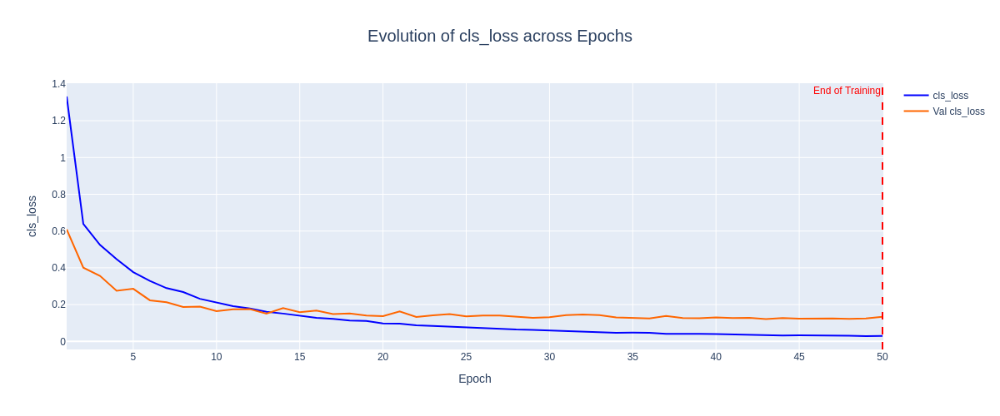

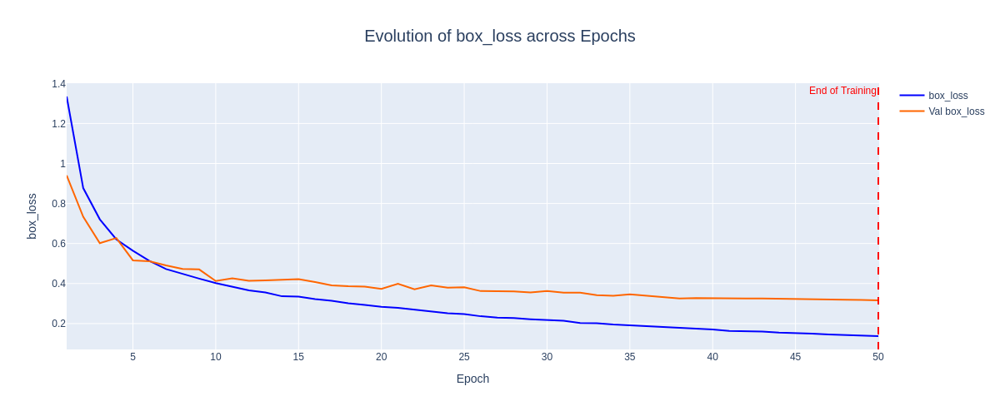

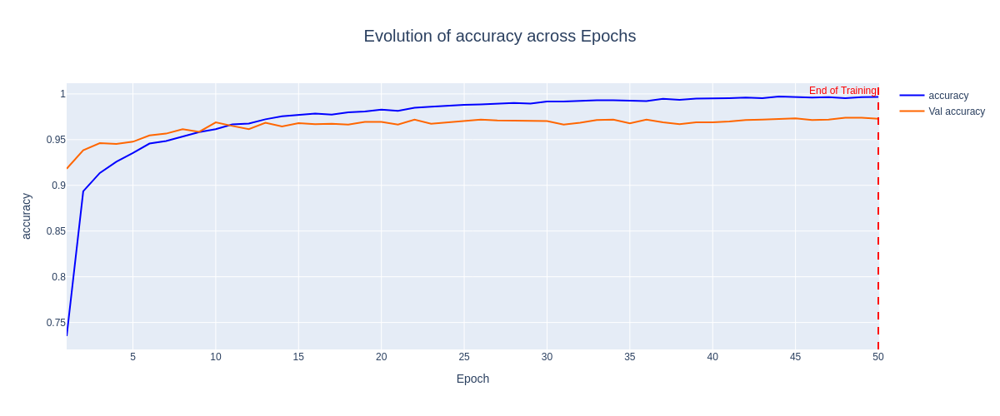

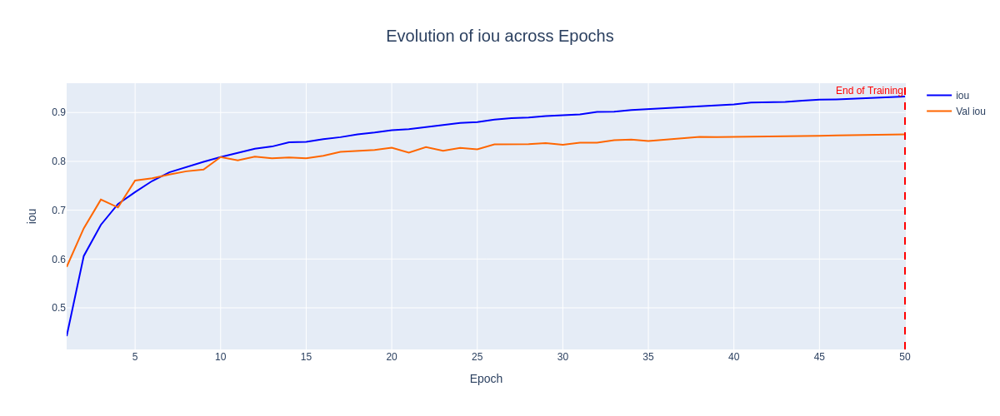

In [ ]:
# Static image for GitHub
plot_metrics(history, idxmax, metrics=list(history.keys())[:4], renderer="png")

### **Confusion Matrix**

In [ ]:
# Make predictions and extract each component of the validation dataset
model.eval()

images_val, classes_val, boxes_val = [], [], []
classes_val_pred, boxes_val_pred = [], []

with torch.no_grad():
  for images, (classes, boxes) in tqdm(val_dataset):
    classes_pred, boxes_pred = model(images.to(device))
    classes_pred = classes_pred.softmax(dim=-1).argmax(dim=-1)
    boxes_pred = boxes_pred.sigmoid()

    images_val.append(images)
    classes_val.append(classes)
    boxes_val.append(boxes)
    classes_val_pred.append(classes_pred.cpu())
    boxes_val_pred.append(boxes_pred.cpu())

images_val = torch.cat(images_val, dim=0)
classes_val = torch.cat(classes_val, dim=0)
boxes_val = torch.cat(boxes_val, dim=0)
classes_val_pred = torch.cat(classes_val_pred, dim=0)
boxes_val_pred = torch.cat(boxes_val_pred, dim=0)

100%|██████████| 127/127 [00:30<00:00,  4.11it/s]


In [ ]:
# Consolidating the accuracy of the validation dataset
print("Accuracy:", torch.mean((classes_val == classes_val_pred).float()).item())
print(f"F1 Score: {f1_score(classes_val, classes_val_pred, average='macro')}")

Accuracy: 0.9728662967681885
F1 Score: 0.9678281023563825


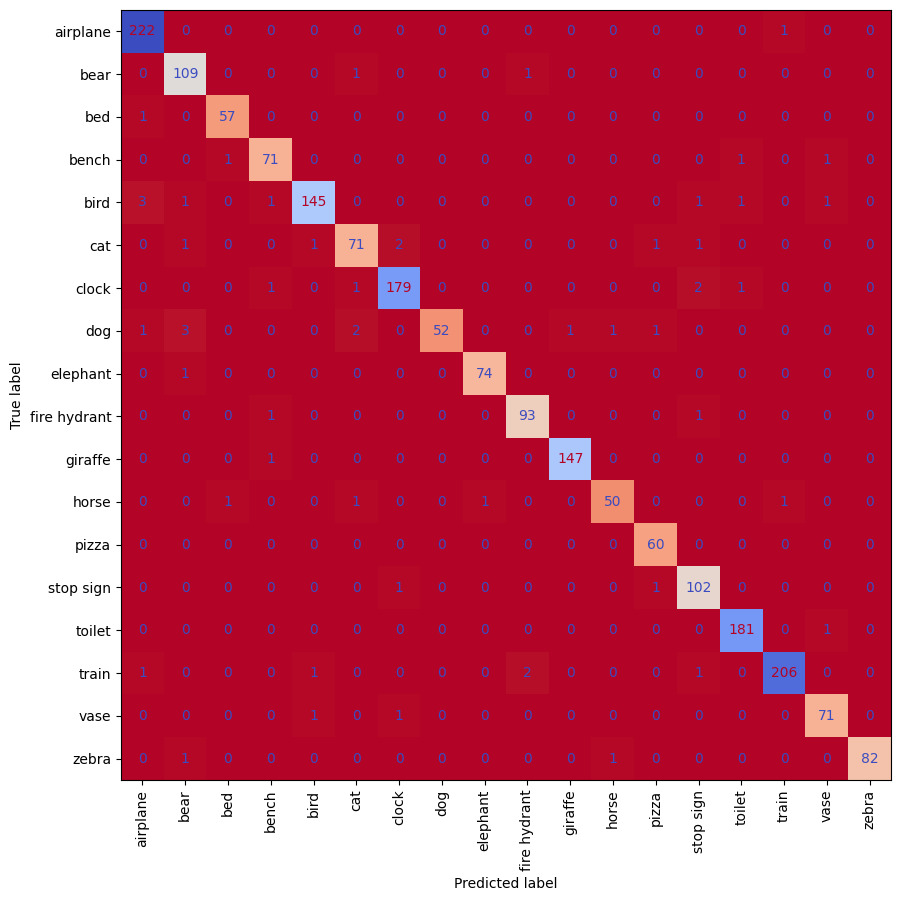

In [ ]:
cm = confusion_matrix(classes_val, classes_val_pred)
cmd = ConfusionMatrixDisplay(cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(10, 10))
cmd.plot(ax=ax, colorbar=False, cmap="coolwarm_r", xticks_rotation="vertical");

### **IoU Metric**

In [ ]:
iou_val = calculate_giou(boxes_val_pred, boxes_val).numpy()

print("Mean IoU:", iou_val.mean())
print("Min IoU:", iou_val.min())
print("Max IoU:", iou_val.max())
print(f"Percentage of detections with IoU >= 0.5: {np.mean(iou_val >= 0.5) * 100:.2f}%")
print(f"Percentage of detections with IoU >= 0.75: {np.mean(iou_val >= 0.75) * 100:.2f}%")
print(f"Percentage of detections with IoU >= 0.9: {np.mean(iou_val >= 0.9) * 100:.2f}%")

Mean IoU: 0.8554766
Min IoU: 0.0
Max IoU: 0.9944403
Percentage of detections with IoU >= 0.5: 95.17%
Percentage of detections with IoU >= 0.75: 85.10%
Percentage of detections with IoU >= 0.9: 56.49%


### **Analysis with a DataFrame**

In [ ]:
# Create the DataFrame with the most relevant variables for analysis
df_eval = pd.DataFrame({
    "class": classes_val,
    "class_pred": classes_val_pred,
    "iou": iou_val
})

df_eval["name"] = df_eval["class"].apply(lambda x: class_names[x])
df_eval["accuracy"] = df_eval.apply(lambda x: 100 if x["class"] == x["class_pred"]  else 0, axis=1)
df_eval.drop(columns=["class", "class_pred"], inplace=True)

df_eval.drop(columns=["name"]).mean()

,0
iou,0.855477
accuracy,97.286630


In [ ]:
# Group the DataFrame by class
df_eval = df_eval.groupby("name").mean()

# Round the digits of the variables appropriately
df_eval["iou"] = df_eval.iou.apply(lambda x: round(x, 4))
df_eval["accuracy"] = df_eval.accuracy.apply(lambda x: round(x, 2))

df_eval.sort_values("iou", ascending=False)

,iou,accuracy
name,,
pizza,0.9338,100.00
elephant,0.9259,98.67
giraffe,0.9229,99.32
zebra,0.9199,97.62
bear,0.9072,98.20
airplane,0.9005,99.55
stop sign,0.8915,98.08
dog,0.8801,85.25
train,0.8587,97.63


## **Inference with the Trained Model**

### **Validation Dataset**

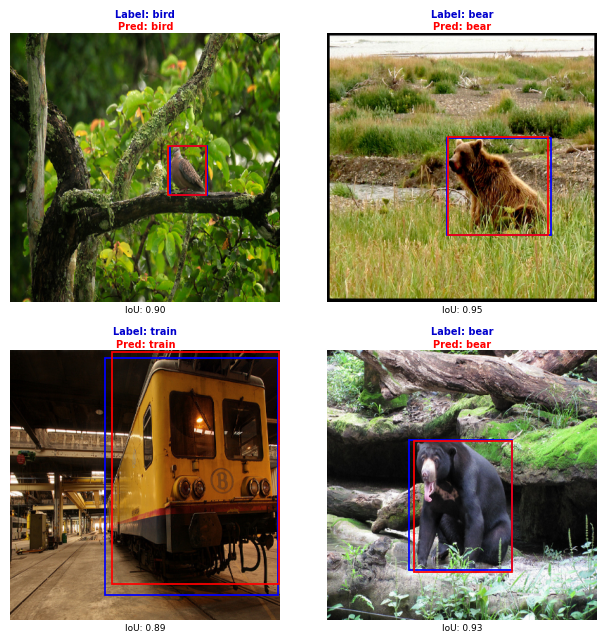

In [ ]:
show_images(
    images_val, classes_val, boxes_val, classes_val_pred, boxes_val_pred,
    n_rows=2, n_cols=2
)

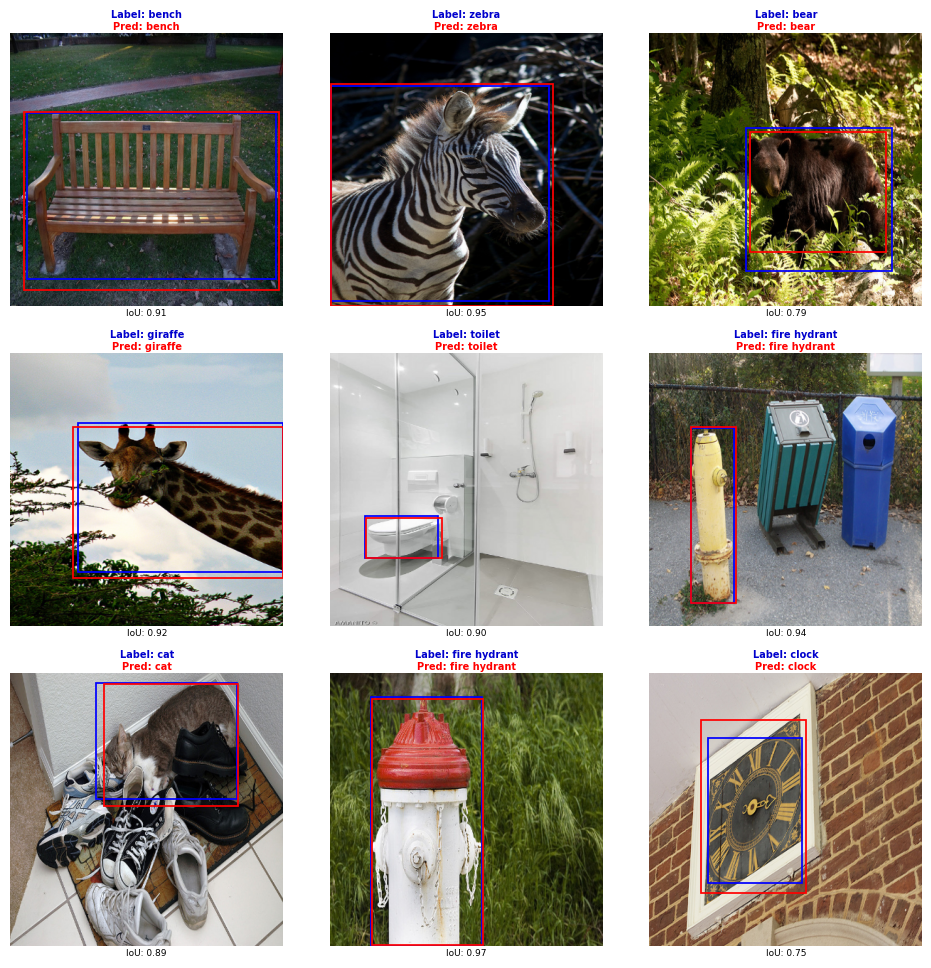

In [ ]:
show_images(images_val, classes_val, boxes_val, classes_val_pred, boxes_val_pred)

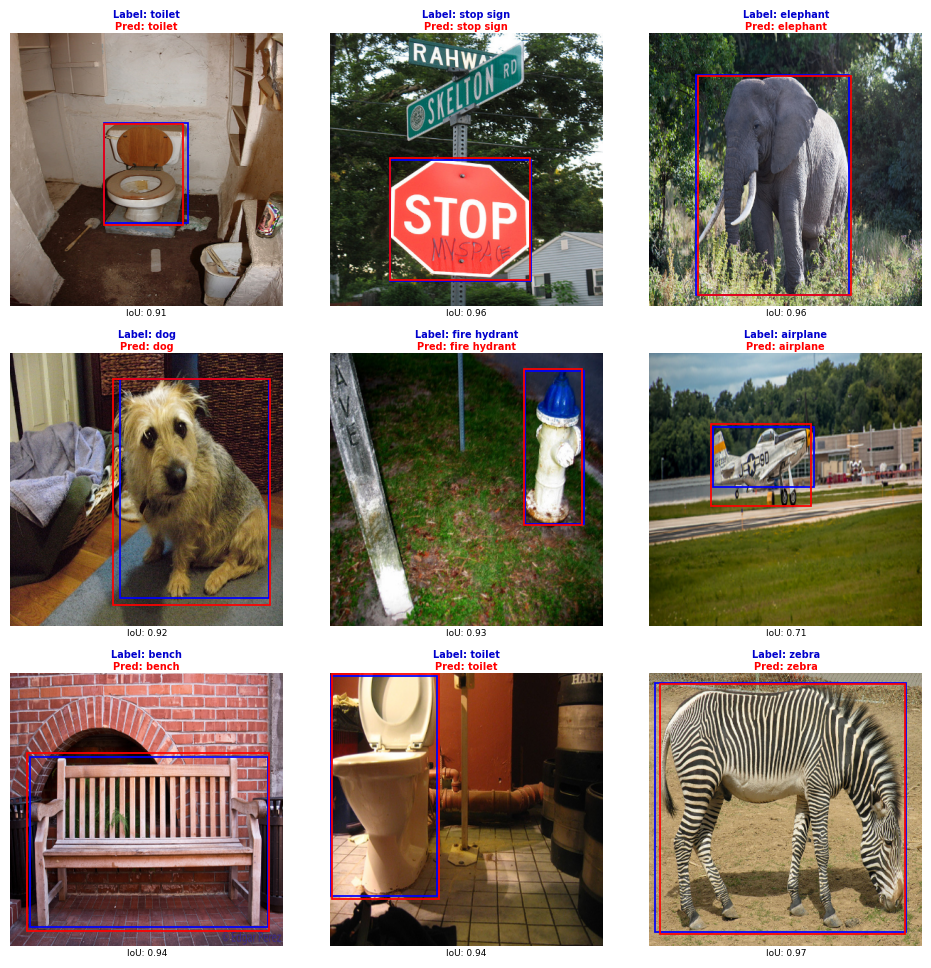

In [ ]:
show_images(
    images_val, classes_val, boxes_val, classes_val_pred, boxes_val_pred,
    save=True, path_save="ObjectDetection_EfficientNetV2S_COCO-SingleBBox_1.png"
)

**Predictions with IoU less than 0.5**

In [ ]:
indices = np.where(iou_val < 0.5)[0]
indices.shape

(98,)

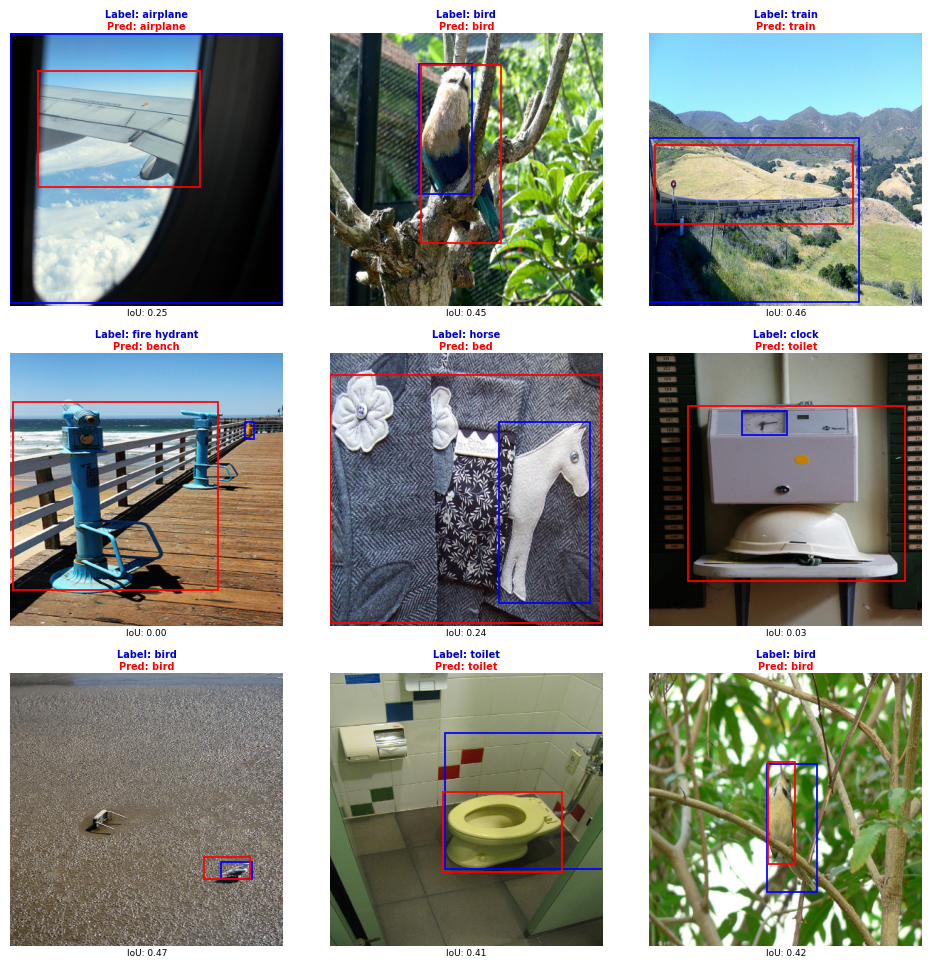

In [ ]:
show_images(
    images_val[indices], classes_val[indices], boxes_val[indices],
    classes_val_pred[indices], boxes_val_pred[indices]
)

It can be observed that in predictions with an IoU below 0.5, there are annotation errors, while in others, the instances are very small or ambiguous, which justifies the model's poor performance on these images.

**Predictions with IoU greater than or equal to 0.95**

In [ ]:
indices = np.where(iou_val >= 0.95)[0]
indices.shape

(517,)

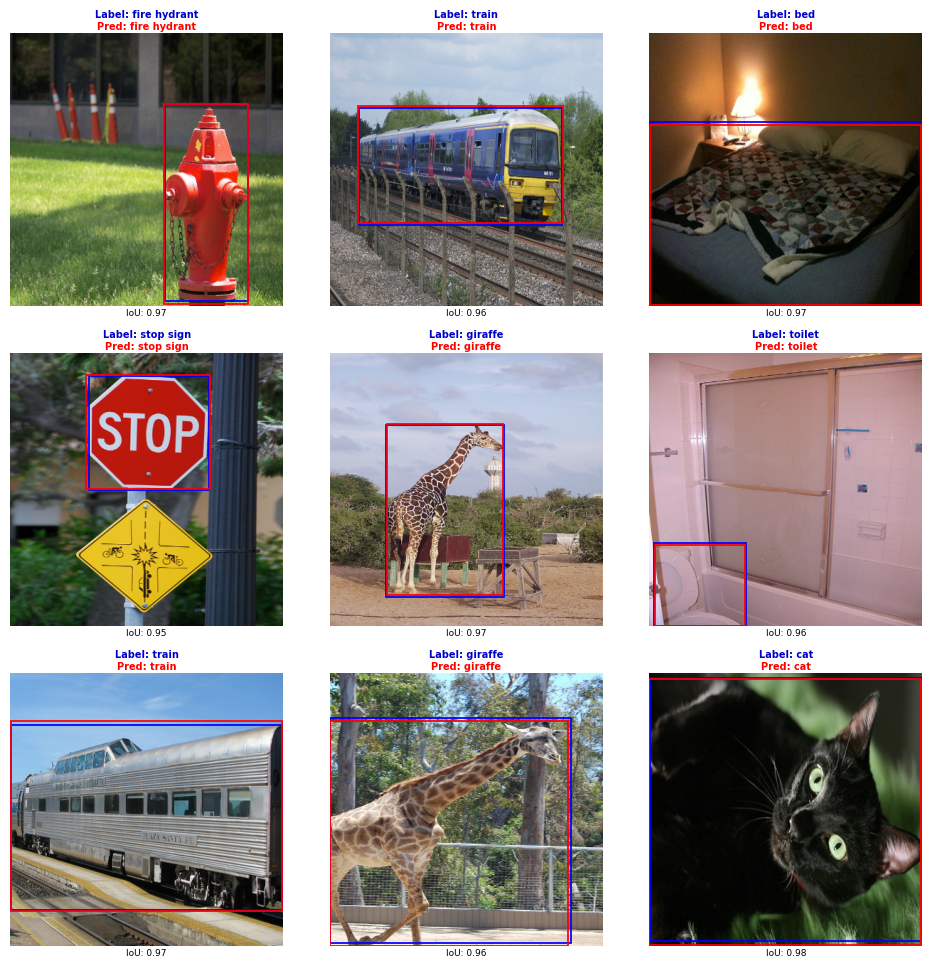

In [ ]:
show_images(
    images_val[indices], classes_val[indices], boxes_val[indices],
    classes_val_pred[indices], boxes_val_pred[indices]
)

**Incorrect classifier predictions**

In [ ]:
indices = np.where(classes_val != classes_val_pred)[0]
indices.shape

(55,)

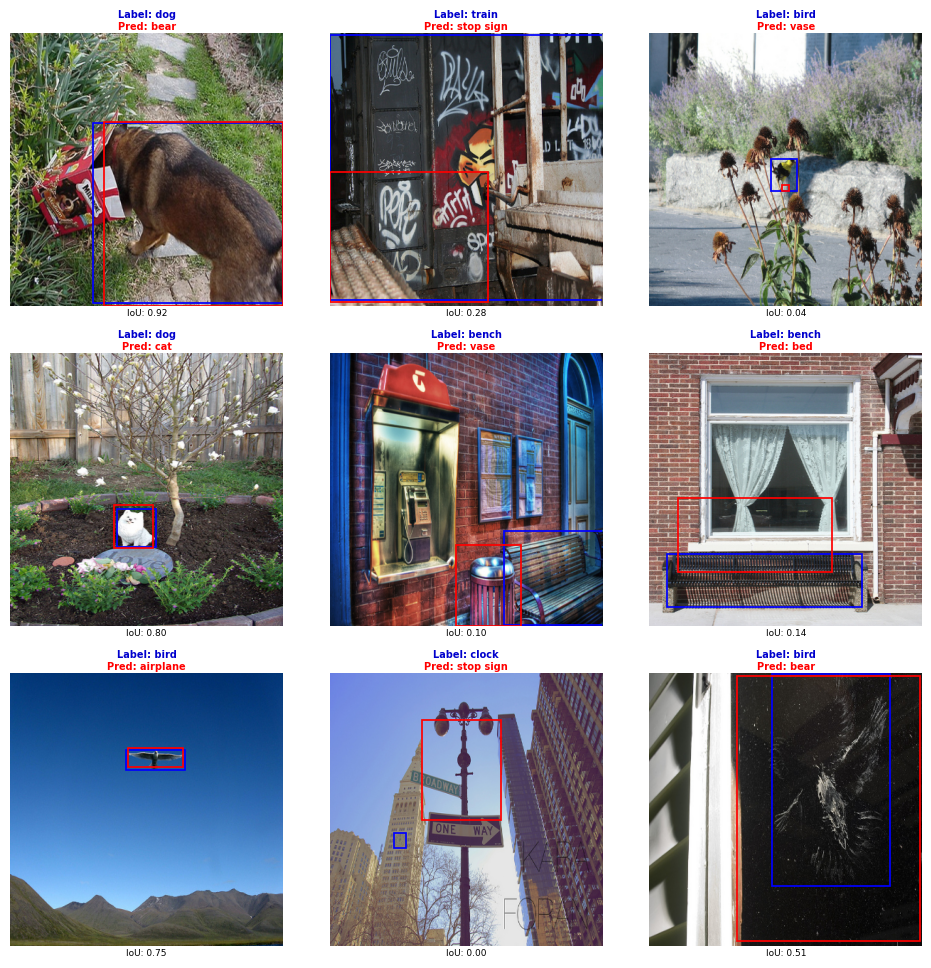

In [ ]:
show_images(
    images_val[indices], classes_val[indices], boxes_val[indices],
    classes_val_pred[indices], boxes_val_pred[indices]
)

It is observed that in most cases of incorrect classifications, the objects are occluded, have complex backgrounds, or contain multiple objects, which also justifies the model's errors in classifying these images.

### **Internet Images**

In [ ]:
# Load the trained model
model = CustomModel(model_name, num_classes).to(device)
model.load_state_dict(torch.load(trained_model_path, weights_only=True))

<All keys matched successfully>

In [ ]:
# Function for object detection in images from the internet
def coco_detection_url(model, list_urls, n_rows=3, n_cols=3, save=False, path_save=""):
  model.eval()
  # Download the images and convert them to NumPy arrays
  images, inputs = [], []

  for url in list_urls:
    response = requests.get(url)
    image = Image.open(io.BytesIO(response.content)).convert("RGB")

    images.append(np.array(image))
    inputs.append(np.array(image.resize(image_size[1:])))

  # Preprocess the images
  inputs = torch.stack([torch.tensor(img).permute(2, 0, 1) for img in inputs], dim=0)
  inputs = inputs / 255

  # Predict the classes and the coordinates of the bounding boxes
  with torch.no_grad():
    classes_pred, boxes_pred = model(inputs.to(device))
    classes_pred = classes_pred.softmax(dim=-1).cpu().numpy()
    logits = classes_pred.max(axis=-1)
    classes_pred = classes_pred.argmax(axis=-1)
    boxes_pred = boxes_pred.sigmoid().cpu().numpy()

  fig, axes = plt.subplots(n_rows, n_cols, figsize=(3.6*n_cols, 3.6*n_rows))

  for i, ax in enumerate(axes.flat):
    image = images[i]
    shape = image.shape
    cls = classes_pred[i]
    logit = logits[i]
    box = boxes_pred[i]

    ax.imshow(image)

    xmin, ymin, xmax, ymax = tuple(box)
    xmin, xmax = xmin*shape[1], xmax*shape[1]
    ymin, ymax = ymin*shape[0], ymax*shape[0]
    rect = patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, linewidth=1.5, edgecolor="blue", facecolor="none")
    ax.add_patch(rect)

    ax.text(
        x=xmin, y=ymin, s=f"{class_names[cls]}:  {logit*100:.1f}%",
        color="black", fontsize=7, fontweight="bold", ha="left", va="bottom",
        bbox={"boxstyle":"square,pad=0", "facecolor": "blue", "edgecolor":"blue", "alpha":0.7}
    )

    ax.axis("off")

  plt.tight_layout()
  # Save images
  if save:
    plt.savefig(path_save)

  plt.show()

In [ ]:
list_urls = [
    "https://upload.wikimedia.org/wikipedia/commons/thumb/3/36/United_Airlines_Boeing_777-200_Meulemans.jpg/800px-United_Airlines_Boeing_777-200_Meulemans.jpg",
    "https://wwfgifts-files.worldwildlife.org/wwfgifts/images/grizzly-bear-large-photo.jpg",
    "https://www.casafurnishing.in/wp-content/uploads/2021/11/upholstered-bed-Sheesham-Wood-Double-bed-1.jpg",
    "https://www.wallart.com/media/catalog/product/cache/5b18b93ddbe5d6592c6b175f41d24454/w/0/w03369-small.jpg",
    "https://images.squarespace-cdn.com/content/v1/586fc0a6bf629abf69254ce7/1507050487161-XREBC34CL05QN0X47WFX/Goodlet_140921_%5B20140921-%5B412A2637%5D-Marievale-0673%5D-Edit.jpg",
    "https://images.pexels.com/photos/1170986/pexels-photo-1170986.jpeg?auto=compress&cs=tinysrgb&dpr=1&w=500",
    "https://i2-prod.lincolnshirelive.co.uk/incoming/article8736232.ece/ALTERNATES/s1200b/1_IMG_4491.jpg",
    "https://spotpet.com/_next/image?url=https%3A%2F%2Fimages.ctfassets.net%2Fm5ehn3s5t7ec%2Fwp-image-201043%2F25858af85afb94408da1f3d74fbb6c4b%2FCane_Corso_Price.jpeg&w=3840&q=75",
    "https://media.istockphoto.com/id/1452952557/photo/big-tusker-craig-in-amboseli-kenya-with-a-clouded-sky-in-the-background.jpg?s=612x612&w=0&k=20&c=Hs2YQUox5mIG0NJlyhqNjRklTGvkVmk_UfHs18lYg6E=",

    "https://s3.envato.com/files/414356020/2d4aa2e6-1e83-4657-9b9a-87cc0e40ab13.jpg",
    "https://www.nashvillezoo.org/assets/2147/giraffe_conservation_-_2024_-_jenna_mg_0625_2.jpg",
    "https://iadsb.tmgrup.com.tr/7ddb86/0/0/0/0/1926/1086?u=https://idsb.tmgrup.com.tr/2018/05/22/horses-the-wings-of-mankind-1527015927739.jpg",
    "https://recipesblob.oetker.in/assets/d8a4b00c292a43adbb9f96798e028f01/1272x764/pizza-pollo-arrostojpg.webp",
    "https://condosigns.ca/cdn/shop/files/04758a1c-031c-4242-aa11-cd4d6881b6e0.jpg?v=1692987998&width=480",
    "https://www.bathroommountain.co.uk/img/1900/1900/resize/catalog/product/c/6/c66201-1000-traditional-close-coupled-toilet-soft-close-seat_1.jpg",
    "https://static.toiimg.com/thumb/msid-113930350,width-1280,height-720,resizemode-4/113930350.jpg",
    "https://assets.myntassets.com/dpr_1.5,q_60,w_400,c_limit,fl_progressive/assets/images/29560962/2024/5/15/879e7fe7-b768-4556-87a2-8994a5fd35ac1715756428382Vases1.jpg",
    "https://www.marylandzoo.org/wp-content/uploads/2017/10/zebra_web-1024x683.jpg"
]

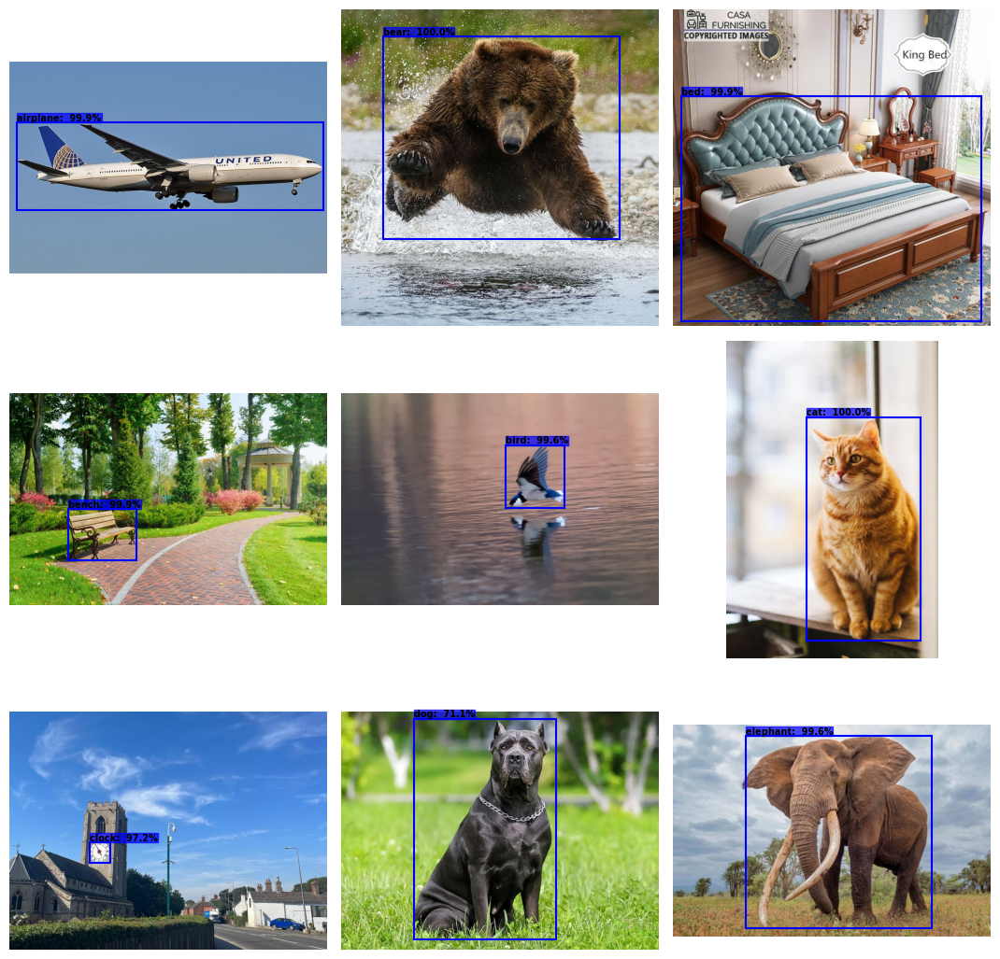

In [ ]:
coco_detection_url(
    model, list_urls[:9], save=True,
    path_save="ObjectDetection_EfficientNetV2S_COCO-SingleBBox_2.png"
)

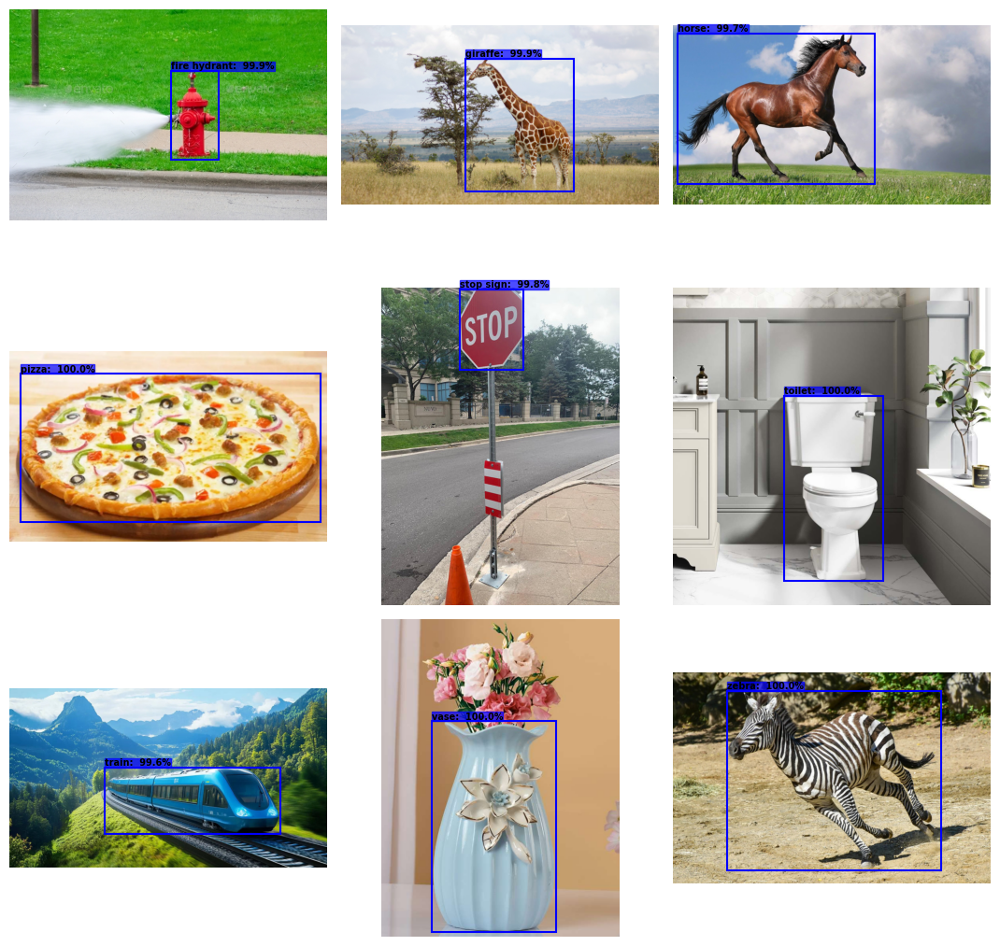

In [ ]:
coco_detection_url(
    model, list_urls[9:], save=True,
    path_save="ObjectDetection_EfficientNetV2S_COCO-SingleBBox_3.png"
)

## **Conclusion**

The fine-tuned **EfficientNetV2-S** model achieved **99.67%** **accuracy** and an **average IoU** of **0.9328** on the **training dataset**, and **97.29%** **accuracy**, an **f1 score** of **96.78%**, and an **average IoU** of **0.8555** on the **validation dataset**. These results indicate that the classifier performs very well, while the box regressor shows a medium-high performance. There is slight overfitting in the classifier, while the box regressor exhibits a bit more overfitting, which is expected since the EfficientNetV2-S model is primarily designed for image classification, leading to lower performance in detection. Additionally, during inference, it was observed that the model performs poorly in detection or classification when the images contain instances with erroneous annotations, very small or ambiguous objects, or challenging backgrounds. However, when the images are free from errors or challenging backgrounds, like the internet image examples used in the inference, the model excels in both classification and detection.

To further improve model performance, it would be necessary to expand the training and validation datasets with more images of the 18 classes and their corresponding bounding boxes. This would prevent the classifier's loss from converging too quickly, help the model learn from images with more challenging backgrounds, and enable the use of larger and more advanced models than EfficientNetV2-S, ultimately enhancing both classifier and regressor performance. Despite these limitations, significant results have been achieved with challenging images and excellent results with less challenging ones.